# Imports

In [2]:
import os
import glob
import datetime
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import random
import pickle

from config import *
from train import *
from objects import COORDS
from utils import (download_data,
                   sample_fits,
                   data_augmentation,
                   normalize,
                   fits_processing,
                   fits2images,
                   save_images)

# Build Generator

In [3]:
generator = build_generator()
generator.load_weights("epoch_500_generator.h5")

2021-08-18 22:45:53.473483: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Generate Super Resolution Images

In [27]:
val_splus,val_legacy = get_data(data_dir = DATA_DIR+"validation/",
                                train_size = 25,
                                augmentation_factor = 1)

train_splus,train_legacy = get_data(data_dir = DATA_DIR+"train/",
                                train_size = 25,
                                augmentation_factor = 1)

In [28]:
val_generated = normalize(np.array(generator(val_splus)))
train_generated = normalize(np.array(generator(train_splus)))

## Train Sample

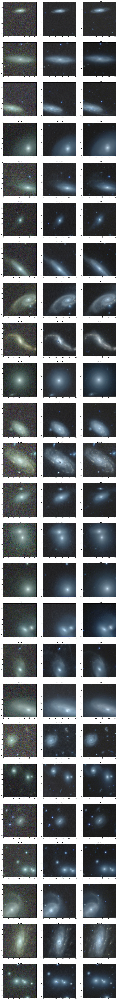

In [34]:
fig,ax = plt.subplots(25,3,figsize=(20,180))
for i in range(25):
    ax[i,0].imshow(train_splus[i])
    ax[i,0].set_title("SPLUS")
    
    ax[i,1].imshow(train_generated[i])
    ax[i,1].set_title("SPLUS - SR")

    ax[i,2].imshow(train_legacy[i])
    ax[i,2].set_title("LEGACY")

In [35]:
plt.savefig("images/train.png") 

<Figure size 432x288 with 0 Axes>

## Validation

In [ ]:
fig,ax = plt.subplots(25,3,figsize=(20,180))
for i in range(25):
    ax[i,0].imshow(val_splus[i])
    ax[i,0].set_title("SPLUS")
    
    ax[i,1].imshow(val_generated[i])
    ax[i,1].set_title("SPLUS - SR")

    ax[i,2].imshow(val_legacy[i])
    ax[i,2].set_title("LEGACY")
plt.savefig("images/validation") 